In [1]:
!{sys.executable} -m pip install -r requirements.txt
!sh buildproto.sh

/bin/sh: 1: {sys.executable}: not found


In [2]:
import sn_bayes
from sn_bayes.utils import any_of
from sn_bayes.utils import all_of
from sn_bayes.utils import avg
from sn_bayes.utils import if_then_else
from sn_bayes.utils import bayesInitialize
from sn_bayes.utils import addCpt
from sn_bayes.utils import dependency
from sn_bayes.utils import non_cpt_descriptions

import sn_service.service_spec.bayesian_pb2
from sn_service.service_spec.bayesian_pb2 import BayesianNetwork




In the independent case, Anyof is correct in the way it treats the variables independently

In [3]:

#EXAMPLE  any_of mitigated without dependency


        bayesianNetwork0 = BayesianNetwork()
        cpt = {}
        outstr = '' 



        discreteDistribution = bayesianNetwork0.discreteDistributions.add()
        discreteDistribution.name = "hypertension"
        variable = discreteDistribution.variables.add()
        variable.name = "hypertension"
        variable.probability = 0.50
        variable = discreteDistribution.variables.add()
        variable.name = "no_hypertension"
        variable.probability = 0.50
        

        discreteDistribution = bayesianNetwork0.discreteDistributions.add()
        discreteDistribution.name = "disorders_of_lipid_metabolism"
        variable = discreteDistribution.variables.add()
        variable.name = "disorders_of_lipid_metabolism"
        variable.probability = 0.50
        variable = discreteDistribution.variables.add()
        variable.name = "no_disorders_of_lipid_metabolism"
        variable.probability = 0.50
        

        discreteDistribution = bayesianNetwork0.discreteDistributions.add()
        discreteDistribution.name = "diabetes"
        variable = discreteDistribution.variables.add()
        variable.name = "diabetes"
        variable.probability = 0.50
        variable = discreteDistribution.variables.add()
        variable.name = "no_diabetes"
        variable.probability = 0.50
        

                 
        cpt["metabolic_disease"] = any_of(bayesianNetwork0,cpt,
                {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_disease","no_metabolic_disease"]
                 
         )
        
        

        cpt["metabolic_syndrome"] = all_of(bayesianNetwork0,cpt,
       {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_syndrome","no_metabolic_syndrome"]
                 
         )

        

        outstr = outstr + non_cpt_descriptions(bayesianNetwork0)
        outstr = outstr + addCpt(bayesianNetwork0,cpt) 
        from sn_bayes.utils import bayesInitialize
        longevity0 = bayesInitialize(bayesianNetwork0)
        longevity0.bake()
        bayesianNetwork0


discreteDistributions {
  name: "hypertension"
  variables {
    name: "hypertension"
    probability: 0.5
  }
  variables {
    name: "no_hypertension"
    probability: 0.5
  }
}
discreteDistributions {
  name: "disorders_of_lipid_metabolism"
  variables {
    name: "disorders_of_lipid_metabolism"
    probability: 0.5
  }
  variables {
    name: "no_disorders_of_lipid_metabolism"
    probability: 0.5
  }
}
discreteDistributions {
  name: "diabetes"
  variables {
    name: "diabetes"
    probability: 0.5
  }
  variables {
    name: "no_diabetes"
    probability: 0.5
  }
}
conditionalProbabilityTables {
  name: "metabolic_disease"
  randomVariables {
    name: "hypertension"
  }
  randomVariables {
    name: "disorders_of_lipid_metabolism"
  }
  randomVariables {
    name: "diabetes"
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    randomVariableValues {
      n

In [4]:
findsum = longevity0.probability([
         ['hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "metabolic_syndrome"], ['hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "no_metabolic_disease",
    "no_metabolic_syndrome"],
])
findsum

array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125])

In [5]:
findsum.sum()

1.0000000000000002

In [6]:
 longevity0.predict_proba({}) 

array([{
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "hypertension" : 0.5,
            "no_hypertension" : 0.5
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "disorders_of_lipid_metabolism" : 0.5,
            "no_disorders_of_lipid_metabolism" : 0.5
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "diabetes" : 0.5,
            "no_diabetes" : 0.5
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.8749999999999999,
            "no_metabolic_disease" : 0.1250000000000002
        }
    ],
  

In [7]:
 longevity0.predict_proba({"hypertension":"no_hypertension"}) 

array(['no_hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "disorders_of_lipid_metabolism" : 0.5,
            "no_disorders_of_lipid_metabolism" : 0.5
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "diabetes" : 0.5,
            "no_diabetes" : 0.5
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.7499999999999999,
            "no_metabolic_disease" : 0.2500000000000001
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_metabolic_syndrome" : 1.0,
            "metabol

In [8]:
 longevity0.predict_proba({"hypertension":"hypertension"}) 

array(['hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "disorders_of_lipid_metabolism" : 0.5,
            "no_disorders_of_lipid_metabolism" : 0.5
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "diabetes" : 0.5,
            "no_diabetes" : 0.5
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 1.0,
            "no_metabolic_disease" : 0.0
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_metabolic_syndrome" : 0.7499999999999999,
            "metabolic_syndrome" : 0.2

### Problem 1:  correlation vs. cause in the net

Lets view A as a test of B and C, and B as a test of C
I want to estimate my risk of condition C 
lets also simplify that the only way you can get B is from A and the only way you can get C is from B

scenario 1

Say we have A leads to B half the time and B leads to C half the time.
then A leads to C a forth of the time.
Say A occurs naturally at 50%
Then B would occur at 25%
and C would occur at 12.5%



C:

the illustration below shows that
so A causes C at sensitivity 1.0 and specificity .5714
and B causes C at sensitivity 1.0 and specificity .8571

B:
The illustration below shows that
A causes B at sensitivity 1.0 and specificity .666

so how is it that I can get the same answer for C, when it looks like this:
C:
The illustration below shows that 
and B causes C at sensitivity 1.0 and specificity .8571

### Problem 2:  mitigation of anyof and all of.  Anyof treats the variables as independent.  Is this made up for by dependencies before the anyof CPT?  

for anyof, chance of true = abc(.125) + abNOTc (.125) + aNOTbNOTc (.25) = .5 ; chance of false = NOTaNOTbNOTc = .5

for allof, chance of true = abc = .125 ; chance of false = .875


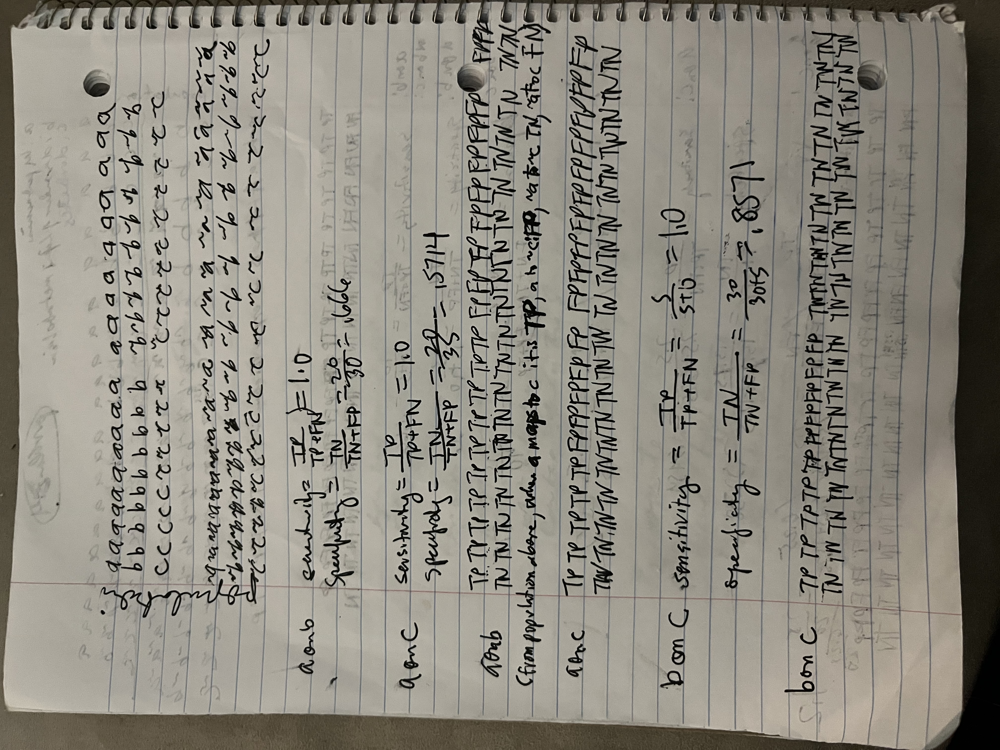

In [9]:


##### EXAMPLE  any_of mitigated without dependency


        bayesianNetwork1 = BayesianNetwork()
        cpt = {}
        outstr = '' 



        discreteDistribution = bayesianNetwork1.discreteDistributions.add()
        discreteDistribution.name = "hypertension"
        variable = discreteDistribution.variables.add()
        variable.name = "hypertension"
        variable.probability = 0.50
        variable = discreteDistribution.variables.add()
        variable.name = "no_hypertension"
        variable.probability = 0.50
        
        
 
        cpt["disorders_of_lipid_metabolism"] = dependency(bayesianNetwork1,cpt,
        [
            ({"hypertension":["hypertension"]},{"sensitivity":1.0, "specificity":0.6666})],
        {"disorders_of_lipid_metabolism":0.25,"no_disorders_of_lipid_metabolism":0.75}
        )
        
     

        outstr = outstr + addCpt(bayesianNetwork1,cpt) 
        cpt = {}

        cpt["diabetes"] = dependency(bayesianNetwork1,cpt,
        [
            ({"hypertension":["hypertension"]},{"sensitivity":1.0, "specificity":0.5714}),
            ({"disorders_of_lipid_metabolism":["disorders_of_lipid_metabolism"]},{"sensitivity":1.0, "specificity":0.8571})],
        {"diabetes":0.125,"no_diabetes":0.875}
        )
        
        

        outstr = outstr + addCpt(bayesianNetwork1,cpt) 
        cpt = {}

                 
        cpt["metabolic_disease"] = any_of(bayesianNetwork1,cpt,
                {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_disease","no_metabolic_disease"]
                 
         )
        

        cpt["metabolic_syndrome"] = all_of(bayesianNetwork1,cpt,
       {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_syndrome","no_metabolic_syndrome"]
                 
         )

        outstr = outstr + non_cpt_descriptions(bayesianNetwork1)
        outstr = outstr + addCpt(bayesianNetwork1,cpt) 

        from sn_bayes.utils import bayesInitialize
        longevity1 = bayesInitialize(bayesianNetwork1)
        longevity1.bake()
        bayesianNetwork1

start timing...
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.25, 0.75]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([0., 0., 0., 1.]), array([0., 0., 1., 0.]), array([-0., -1., -0., -0.]), array([-1., -0., -0., -0.]), array([-0., -0., -0., -1.]), array([-0., -0., -1., -0.])]
rhs_ineq
[1.0, 1.0, 1.0, 1.0, -0.0, -0.0, -0.0, -0.0]
bnd
[(0, 1.0), (0, 1.0), (0, 1.0), (0, 1.0)]
opt
     con: array([0., 0., 0., 0.])
     fun: 2.0
 message: 'Optimization terminated successfully.'
     nit: 4
   slack: array([ 1. ,  0.5,  0. ,  0.5, -0. ,  0.5,  1. ,  0.5])
  status: 0
 success: True
       x: array([0.5, 0. , 0.5, 1. ])
window
0.5
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.25, 0.75]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([0., 0., 0., 1.])

/home/opencog/bayesnet/sn_bayes/utils.py:2136: OptimizeWarning: A_eq does not appear to be of full row rank. To improve performance, check the problem formulation for redundant equality constraints.
  opt = linprog(c=obj, A_ub=lhs_ineq, b_ub=rhs_ineq,A_eq=lhs_eq, b_eq=rhs_eq,  bounds=bnd,method="revised simplex")


discreteDistributions {
  name: "hypertension"
  variables {
    name: "hypertension"
    probability: 0.5
  }
  variables {
    name: "no_hypertension"
    probability: 0.5
  }
}
conditionalProbabilityTables {
  name: "disorders_of_lipid_metabolism"
  randomVariables {
    name: "hypertension"
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.4921875
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "no_disorders_of_lipid_metabolism"
    }
    probability: 0.5078125
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "no_hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.0078125
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "no_hypertension"
    }
   

In [10]:
findsum = longevity1.probability([
         ['hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "metabolic_syndrome"], ['hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "no_metabolic_disease",
    "no_metabolic_syndrome"],
])
findsum

array([0.12302813, 0.12306562, 0.        , 0.25390625, 0.        ,
       0.00390625, 0.00197187, 0.49412188])

In [11]:
findsum.sum()

1.0000000011550583

In [12]:
 longevity1.predict_proba({}) 

array([{
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "hypertension" : 0.4999999994224708,
            "no_hypertension" : 0.5000000005775292
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.7500000004297358,
            "disorders_of_lipid_metabolism" : 0.24999999957026417
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.9360189728413253,
            "diabetes" : 0.0639810271586747
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.64

In [13]:
 longevity1.predict_proba({"hypertension":"no_hypertension"}) 

array(['no_hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.9921875000180469,
            "disorders_of_lipid_metabolism" : 0.007812499981953092
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.996056255446107,
            "diabetes" : 0.003943744553892986
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.011725434031589741,
            "no_metabolic_disease" : 0.9882745659684103
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        

In [14]:
 longevity1.predict_proba({"hypertension":"hypertension"}) 

array(['hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.5078125,
            "disorders_of_lipid_metabolism" : 0.49218749999999994
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.7539437422528859,
            "diabetes" : 0.2460562577471141
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 1.0,
            "no_metabolic_disease" : 0.0
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_metabolic_syndrome" : 0.8788

In [15]:
#EXAMPLE  any_of mitigated without dependency


bayesianNetwork1_1 = BayesianNetwork()
cpt = {}
outstr = '' 



discreteDistribution = bayesianNetwork1_1.discreteDistributions.add()
discreteDistribution.name = "hypertension"
variable = discreteDistribution.variables.add()
variable.name = "hypertension"
variable.probability = 0.50
variable = discreteDistribution.variables.add()
variable.name = "no_hypertension"
variable.probability = 0.50



cpt["disorders_of_lipid_metabolism"] = dependency(bayesianNetwork1_1,cpt,
[
    ({"hypertension":["hypertension"]},{"sensitivity":1.0, "specificity":0.6666})],
{"disorders_of_lipid_metabolism":0.25,"no_disorders_of_lipid_metabolism":0.75}
)



outstr = outstr + addCpt(bayesianNetwork1_1,cpt) 
cpt = {}

cpt["diabetes"] = dependency(bayesianNetwork1_1,cpt,
[
    #({"hypertension":["hypertension"]},{"sensitivity":1.0, "specificity":0.5714}),
    ({"disorders_of_lipid_metabolism":["disorders_of_lipid_metabolism"]},{"sensitivity":1.0, "specificity":0.8571})
],
{"diabetes":0.125,"no_diabetes":0.875}
)

cpt["metabolic_disease"] = any_of(bayesianNetwork1_1,cpt,
        {
 'hypertension':{ "hypertension"},
 "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
 "diabetes":{"diabetes"}
 },
 ["metabolic_disease","no_metabolic_disease"]

 )


cpt["metabolic_syndrome"] = all_of(bayesianNetwork1_1,cpt,
{
 'hypertension':{ "hypertension"},
 "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
 "diabetes":{"diabetes"}
 },
 ["metabolic_syndrome","no_metabolic_syndrome"]

 )
outstr = outstr + non_cpt_descriptions(bayesianNetwork1_1)
outstr = outstr + addCpt(bayesianNetwork1_1,cpt) 
from sn_bayes.utils import bayesInitialize
longevity1_1 = bayesInitialize(bayesianNetwork1_1)
longevity1_1.bake()
bayesianNetwork1_1


start timing...
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.25, 0.75]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([0., 0., 0., 1.]), array([0., 0., 1., 0.]), array([-0., -1., -0., -0.]), array([-1., -0., -0., -0.]), array([-0., -0., -0., -1.]), array([-0., -0., -1., -0.])]
rhs_ineq
[1.0, 1.0, 1.0, 1.0, -0.0, -0.0, -0.0, -0.0]
bnd
[(0, 1.0), (0, 1.0), (0, 1.0), (0, 1.0)]
opt
     con: array([0., 0., 0., 0.])
     fun: 2.0
 message: 'Optimization terminated successfully.'
     nit: 4
   slack: array([ 1. ,  0.5,  0. ,  0.5, -0. ,  0.5,  1. ,  0.5])
  status: 0
 success: True
       x: array([0.5, 0. , 0.5, 1. ])
window
0.5
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.25, 0.75]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([0., 0., 0., 1.])

discreteDistributions {
  name: "hypertension"
  variables {
    name: "hypertension"
    probability: 0.5
  }
  variables {
    name: "no_hypertension"
    probability: 0.5
  }
}
conditionalProbabilityTables {
  name: "disorders_of_lipid_metabolism"
  randomVariables {
    name: "hypertension"
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.4921875
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "no_disorders_of_lipid_metabolism"
    }
    probability: 0.5078125
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "no_hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.0078125
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "no_hypertension"
    }
   

In [16]:
findsum = longevity1_1.probability([
         ['hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "metabolic_syndrome"], ['hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "no_metabolic_disease",
    "no_metabolic_syndrome"],
])
findsum

array([1.23046875e-01, 1.23046875e-01, 1.10114283e-19, 2.53906250e-01,
       1.95312500e-03, 1.95312500e-03, 2.15146369e-19, 4.96093750e-01])

In [17]:
findsum.sum()

1.0

In [18]:
 longevity1_1.predict_proba({}) 

array([{
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "hypertension" : 0.5,
            "no_hypertension" : 0.5
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.7499999999999996,
            "disorders_of_lipid_metabolism" : 0.2500000000000005
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.8749999999999994,
            "diabetes" : 0.12500000000000067
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.6718750000000002,
            "n

In [19]:
 longevity1_1.predict_proba({"hypertension":"no_hypertension"}) 

array(['no_hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.9921874999999991,
            "disorders_of_lipid_metabolism" : 0.007812500000000878
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.996093749999999,
            "diabetes" : 0.003906250000000987
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.01168823242187663,
            "no_metabolic_disease" : 0.9883117675781234
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {

In [20]:
 longevity1_1.predict_proba({"hypertension":"hypertension"}) 

array(['hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.5078124999999999,
            "disorders_of_lipid_metabolism" : 0.49218750000000017
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.7539062499999997,
            "diabetes" : 0.24609375000000036
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 1.0,
            "no_metabolic_disease" : 0.0
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_metabolic_syndrome

    Using Relative risk instead of sensitivity and specificity, we know that the relative risk of getting B if you have A vs if you do not is, 50% vs 0%, or infinity.  The relative risk of getting C if you have A is 25% vs 0% or infinity


In [21]:
 longevity1_1.predict_proba({}) 

array([{
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "hypertension" : 0.5,
            "no_hypertension" : 0.5
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.7499999999999996,
            "disorders_of_lipid_metabolism" : 0.2500000000000005
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.8749999999999994,
            "diabetes" : 0.12500000000000067
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.6718750000000002,
            "n

In [85]:

        bayesianNetwork2 = BayesianNetwork()
        cpt = {}
        outstr = '' 





        discreteDistribution = bayesianNetwork2.discreteDistributions.add()
        discreteDistribution.name = "hypertension"
        variable = discreteDistribution.variables.add()
        variable.name = "hypertension"
        variable.probability = 0.50
        variable = discreteDistribution.variables.add()
        variable.name = "no_hypertension"
        variable.probability = 0.50
        
        
 
        cpt["disorders_of_lipid_metabolism"] = dependency(bayesianNetwork2,cpt,
        [
            ({"hypertension":["hypertension"]},{"relative_risk":9999})],
        {"disorders_of_lipid_metabolism":0.25,"no_disorders_of_lipid_metabolism":0.75}
        )
        
     

        outstr = outstr + addCpt(bayesianNetwork2,cpt) 
        cpt = {}

        cpt["diabetes"] = dependency(bayesianNetwork2,cpt,
        [
            ({"hypertension":["hypertension"]},{"relative_risk":9999}),
            ({"disorders_of_lipid_metabolism":["disorders_of_lipid_metabolism"]},{"relative_risk":9999})],
        {"diabetes":0.125,"no_diabetes":0.875}
        )
        
                 
        cpt["metabolic_disease"] = any_of(bayesianNetwork2,cpt,
                {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_disease","no_metabolic_disease"]
                 
         )
        

        cpt["metabolic_syndrome"] = all_of(bayesianNetwork2,cpt,
       {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_syndrome","no_metabolic_syndrome"]
                 
         )

        outstr = outstr + non_cpt_descriptions(bayesianNetwork2)
        outstr = outstr + addCpt(bayesianNetwork2,cpt) 
        from sn_bayes.utils import bayesInitialize
        longevity2 = bayesInitialize(bayesianNetwork2)
        longevity2.bake()
        bayesianNetwork2
                

start timing...
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.25, 0.75]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([0., 0., 0., 1.]), array([0., 0., 1., 0.]), array([-0., -1., -0., -0.]), array([-1., -0., -0., -0.]), array([-0., -0., -0., -1.]), array([-0., -0., -1., -0.])]
rhs_ineq
[1.0, 1.0, 1.0, 1.0, -0.0, -0.0, -0.0, -0.0]
bnd
[(0, 1.0), (0, 1.0), (0, 1.0), (0, 1.0)]
opt
     con: array([0., 0., 0., 0.])
     fun: 2.0
 message: 'Optimization terminated successfully.'
     nit: 4
   slack: array([ 1. ,  0.5,  0. ,  0.5, -0. ,  0.5,  1. ,  0.5])
  status: 0
 success: True
       x: array([0.5, 0. , 0.5, 1. ])
window
0.5
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.25, 0.75]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([0., 0., 0., 1.])

discreteDistributions {
  name: "hypertension"
  variables {
    name: "hypertension"
    probability: 0.5
  }
  variables {
    name: "no_hypertension"
    probability: 0.5
  }
}
conditionalProbabilityTables {
  name: "disorders_of_lipid_metabolism"
  randomVariables {
    name: "hypertension"
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.49213749170303345
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "no_disorders_of_lipid_metabolism"
    }
    probability: 0.5078625082969666
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "no_hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.007862499915063381
  }
  conditionalProbabilityRows {
    randomVariableValues {
      nam

In [86]:
findsum = longevity2.probability([
         ['hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "metabolic_syndrome"], ['hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "no_metabolic_disease",
    "no_metabolic_syndrome"],
])
findsum

array([0.12300938, 0.12305937, 0.        , 0.25393125, 0.        ,
       0.00393125, 0.00199062, 0.49407814])

In [87]:
findsum.sum()

1.000000006666049

unfortunately, predict proba has a difficult time with the priors.  we seem to need to condition on something then do a weighted sum to get the true priors

In [88]:
 longevity2.predict_proba({}) 

array([{
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "hypertension" : 0.4999999966669756,
            "no_hypertension" : 0.5000000033330245
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.7500000071823236,
            "disorders_of_lipid_metabolism" : 0.2499999928176765
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.9360079029727609,
            "diabetes" : 0.06399209702723921
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.64

In [78]:
 longevity2.predict_proba({"hypertension":"no_hypertension"}) 

array(['no_hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.9921375001897594,
            "disorders_of_lipid_metabolism" : 0.007862499810240639
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.9960187652251772,
            "diabetes" : 0.003981234774822891
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.011812432127401733,
            "no_metabolic_disease" : 0.9881875678725983
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
       

In [79]:
 longevity2.predict_proba({"hypertension":"hypertension"}) 

array(['hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.5078625082969667,
            "disorders_of_lipid_metabolism" : 0.49213749170303334
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.7539812387398396,
            "diabetes" : 0.24601876126016037
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 1.0,
            "no_metabolic_disease" : 0.0
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_metabolic_syndrome

In [28]:

        bayesianNetwork2_1 = BayesianNetwork()
        cpt = {}
        outstr = '' 



        discreteDistribution = bayesianNetwork2_1.discreteDistributions.add()
        discreteDistribution.name = "hypertension"
        variable = discreteDistribution.variables.add()
        variable.name = "hypertension"
        variable.probability = 0.50
        variable = discreteDistribution.variables.add()
        variable.name = "no_hypertension"
        variable.probability = 0.50
        
        
 
        cpt["disorders_of_lipid_metabolism"] = dependency(bayesianNetwork2_1,cpt,
        [
            ({"hypertension":["hypertension"]},{"relative_risk":9999})],
        {"disorders_of_lipid_metabolism":0.25,"no_disorders_of_lipid_metabolism":0.75}
        )
        
     

        outstr = outstr + addCpt(bayesianNetwork2_1,cpt) 
        cpt = {}

        cpt["diabetes"] = dependency(bayesianNetwork2_1,cpt,
        [
           # ({"hypertension":["hypertension"]},{"relative_risk":9999}),
            ({"disorders_of_lipid_metabolism":["disorders_of_lipid_metabolism"]},{"relative_risk":9999})],
        {"diabetes":0.125,"no_diabetes":0.875}
        )
        
                 
        cpt["metabolic_disease"] = any_of(bayesianNetwork2_1,cpt,
                {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_disease","no_metabolic_disease"]
                 
         )
        

        cpt["metabolic_syndrome"] = all_of(bayesianNetwork2_1,cpt,
       {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_syndrome","no_metabolic_syndrome"]
                 
         )

        outstr = outstr + non_cpt_descriptions(bayesianNetwork2_1)
        outstr = outstr + addCpt(bayesianNetwork2_1,cpt) 
        from sn_bayes.utils import bayesInitialize
        longevity2_1 = bayesInitialize(bayesianNetwork2_1)
        longevity2_1.bake()
        bayesianNetwork2_1

start timing...
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.25, 0.75]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([0., 0., 0., 1.]), array([0., 0., 1., 0.]), array([-0., -1., -0., -0.]), array([-1., -0., -0., -0.]), array([-0., -0., -0., -1.]), array([-0., -0., -1., -0.])]
rhs_ineq
[1.0, 1.0, 1.0, 1.0, -0.0, -0.0, -0.0, -0.0]
bnd
[(0, 1.0), (0, 1.0), (0, 1.0), (0, 1.0)]
opt
     con: array([0., 0., 0., 0.])
     fun: 2.0
 message: 'Optimization terminated successfully.'
     nit: 4
   slack: array([ 1. ,  0.5,  0. ,  0.5, -0. ,  0.5,  1. ,  0.5])
  status: 0
 success: True
       x: array([0.5, 0. , 0.5, 1. ])
window
0.5
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.25, 0.75]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([0., 0., 0., 1.])

discreteDistributions {
  name: "hypertension"
  variables {
    name: "hypertension"
    probability: 0.5
  }
  variables {
    name: "no_hypertension"
    probability: 0.5
  }
}
conditionalProbabilityTables {
  name: "disorders_of_lipid_metabolism"
  randomVariables {
    name: "hypertension"
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.49213749170303345
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "no_disorders_of_lipid_metabolism"
    }
    probability: 0.5078625082969666
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "no_hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.007862499915063381
  }
  conditionalProbabilityRows {
    randomVariableValues {
      nam

In [29]:
findsum = longevity2_1.probability([
         ['hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "metabolic_syndrome"], ['hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "no_metabolic_disease",
    "no_metabolic_syndrome"],
])
findsum

array([0.12303437, 0.12303437, 0.        , 0.25393125, 0.00196562,
       0.00196562, 0.        , 0.49606875])

In [30]:
findsum.sum()

0.9999999958090484

In [31]:
 longevity2_1.predict_proba({}) 

array([{
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "hypertension" : 0.5000000020954758,
            "no_hypertension" : 0.49999999790452415
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.7500000031432132,
            "disorders_of_lipid_metabolism" : 0.24999999685678684
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.8750000015716062,
            "diabetes" : 0.12499999842839382
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.

In [32]:
 longevity2_1.predict_proba({"hypertension":"hypertension"}) 

array(['hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.5078625082969666,
            "disorders_of_lipid_metabolism" : 0.49213749170303356
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.7539312541484829,
            "diabetes" : 0.24606874585151708
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 1.0,
            "no_metabolic_disease" : 0.0
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_metabolic_syndrome

In [33]:
 longevity2_1.predict_proba({"hypertension":"no_hypertension"}) 

array(['no_hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.9921375000190331,
            "disorders_of_lipid_metabolism" : 0.007862499980966971
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.9960687500095159,
            "diabetes" : 0.0039312499904840354
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.011762840518475426,
            "no_metabolic_disease" : 0.9882371594815246
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
      


lets say when a is present b is present half the time, and that when a is absent b is present a forth of the time.  
since a naturally occurs half the time, so b naturally occurs 3/8 of the time, .375

the rr for a to b would be .5/.25 = 2

see below illustration that explains sensitivity and spedicity.  According to it, 

sensitivity of test a for b would be .666

specificity of test a for b would be .6




lets say when b is present c is present half the time, and that when b is absent c is present a forth of the time. 
since b naturally occurs 3/8 of the time, c naturally occurs  .375 x .5 + 1-.375 * .25 = .34375

rr for b to c would be .5/.25 = 2

sensitivity of test b for c would be .5454

specificity of test b for c would be .71428



the risk of c in the absense of a is 

a absent b present .5*.25 = .125  risk of c:.5.  

a present b present .5*.5 = .25  risk of c:.5

a absent b absent .5*.75 = .375 risk of c:.25

a present b absent .5*.5 = .25  risk of c:.25



risk of c in the presence of a is (.5 * .5 + .5 * .25)= .375

risk of c in the absense of a is (.25 * .5 + .75 * .25) = .3125

rr for a on c = .375/.3125 = 1.2

See below illustration to see why the sensitivity of test a for c would be .5454

and the specificity of test a for c would be .5238


anyof = 1-NOTa(.5)NOTb(.75)NOTc(.75) = .71875

allof =a(.5)b(.5)c(.5) =  .125

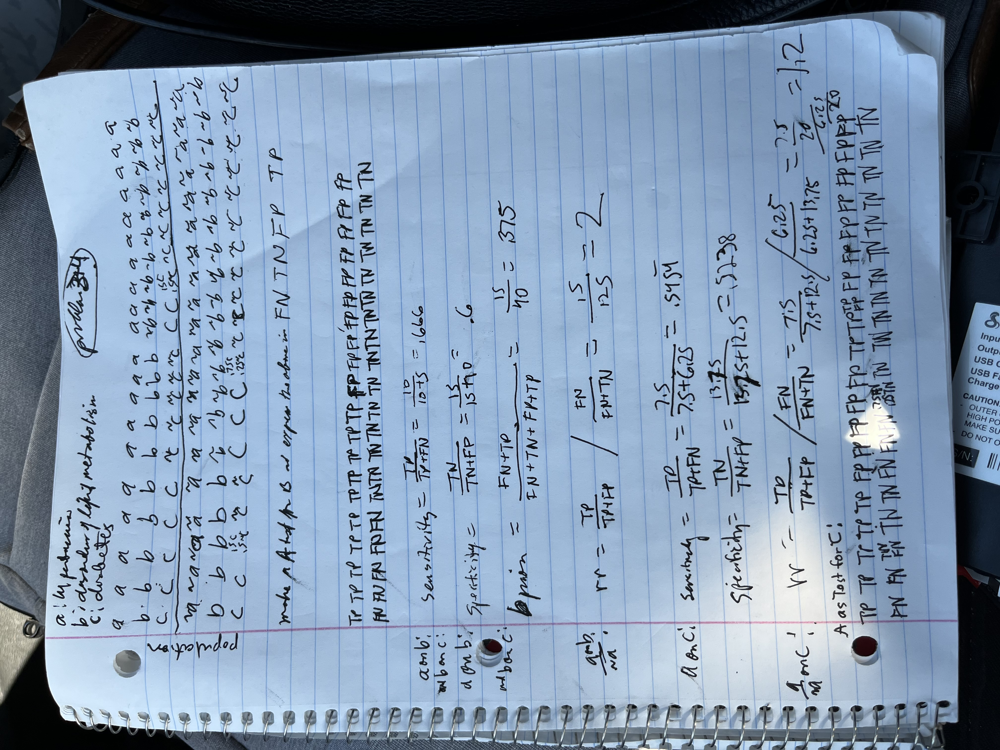

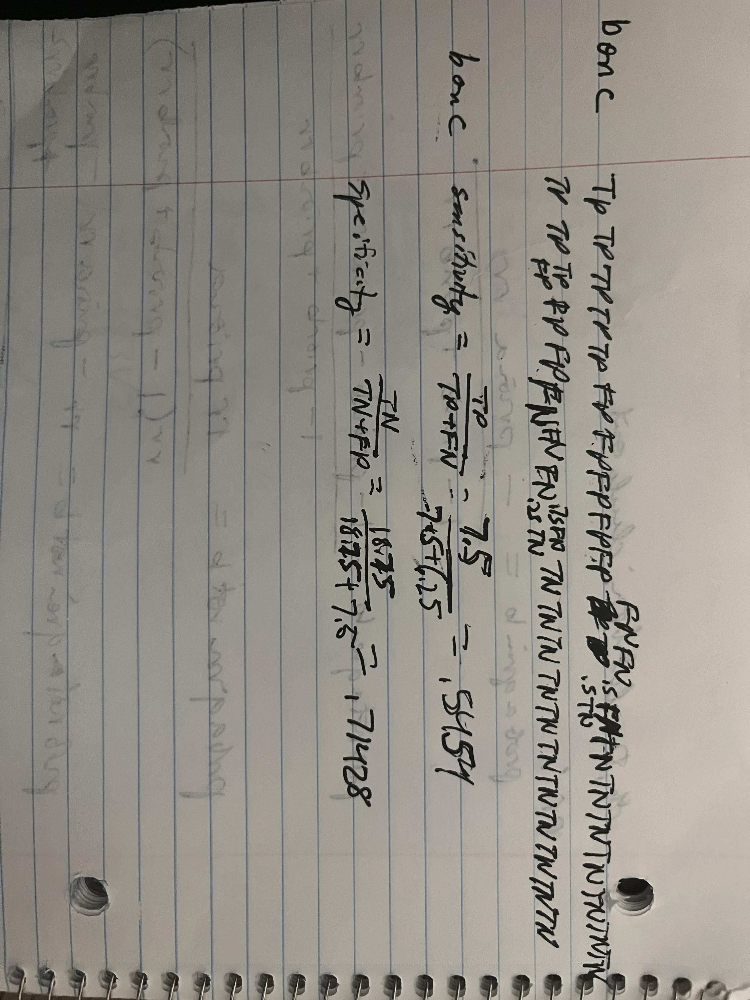

In [34]:
        bayesianNetwork3 = BayesianNetwork()
        cpt = {}
        outstr = '' 



        discreteDistribution = bayesianNetwork3.discreteDistributions.add()
        discreteDistribution.name = "hypertension"
        variable = discreteDistribution.variables.add()
        variable.name = "hypertension"
        variable.probability = 0.50
        variable = discreteDistribution.variables.add()
        variable.name = "no_hypertension"
        variable.probability = 0.50
        
        
 
        cpt["disorders_of_lipid_metabolism"] = dependency(bayesianNetwork3,cpt,
        [
            ({"hypertension":["hypertension"]},{"relative_risk":2})],
        {"disorders_of_lipid_metabolism":0.375,"no_disorders_of_lipid_metabolism":0.625}
        )
        
     

        outstr = outstr + addCpt(bayesianNetwork3,cpt) 
        cpt = {}

        cpt["diabetes"] = dependency(bayesianNetwork3,cpt,
        [
            ({"hypertension":["hypertension"]},{"relative_risk":1.2}),
            ({"disorders_of_lipid_metabolism":["disorders_of_lipid_metabolism"]},{"relative_risk":2})
        ],
        {"diabetes":0.34375,"no_diabetes":0.65625}
        )
        
                 
        cpt["metabolic_disease"] = any_of(bayesianNetwork3,cpt,
                {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_disease","no_metabolic_disease"]
                 
         )
        


        cpt["metabolic_syndrome"] = all_of(bayesianNetwork3,cpt,
       {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_syndrome","no_metabolic_syndrome"]
                 
         )
        outstr = outstr + non_cpt_descriptions(bayesianNetwork3)
        outstr = outstr + addCpt(bayesianNetwork3,cpt) 
        from sn_bayes.utils import bayesInitialize
        longevity3 = bayesInitialize(bayesianNetwork3)
        longevity3.bake()
        bayesianNetwork3
                

start timing...
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.375, 0.625]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([0., 0., 0., 1.]), array([0., 0., 1., 0.]), array([-0., -1., -0., -0.]), array([-1., -0., -0., -0.]), array([-0., -0., -0., -1.]), array([-0., -0., -1., -0.])]
rhs_ineq
[1.0, 1.0, 1.0, 1.0, -0.0, -0.0, -0.0, -0.0]
bnd
[(0, 1.0), (0, 1.0), (0, 1.0), (0, 1.0)]
opt
     con: array([0., 0., 0., 0.])
     fun: 2.0
 message: 'Optimization terminated successfully.'
     nit: 4
   slack: array([ 1.  ,  0.25,  0.  ,  0.75, -0.  ,  0.75,  1.  ,  0.25])
  status: 0
 success: True
       x: array([0.75, 0.  , 0.25, 1.  ])
window
0.5
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.375, 0.625]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([

discreteDistributions {
  name: "hypertension"
  variables {
    name: "hypertension"
    probability: 0.5
  }
  variables {
    name: "no_hypertension"
    probability: 0.5
  }
}
conditionalProbabilityTables {
  name: "disorders_of_lipid_metabolism"
  randomVariables {
    name: "hypertension"
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.4921875
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "no_disorders_of_lipid_metabolism"
    }
    probability: 0.5078125
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "no_hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.2578125
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "no_hypertension"
    }
   

In [35]:
findsum = longevity3.probability([
         ['hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "metabolic_syndrome"], ['hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "no_metabolic_disease",
    "no_metabolic_syndrome"],
])
findsum

array([0.1395438 , 0.10654995, 0.0557687 , 0.19813755, 0.05102539,
       0.07788086, 0.0974121 , 0.27368165])

In [36]:
findsum.sum()

1.0000000000582077

In [37]:
 longevity3.predict_proba({}) 

array([{
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "hypertension" : 0.4999999961873982,
            "no_hypertension" : 0.5000000038126019
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.6249999959618433,
            "disorders_of_lipid_metabolism" : 0.3750000040381567
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.668792519335109,
            "diabetes" : 0.3312074806648911
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.7910

In [38]:
 longevity3.predict_proba({"hypertension":"no_hypertension"}) 

array(['no_hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.7421874942974679,
            "disorders_of_lipid_metabolism" : 0.2578125057025322
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.7031250085674398,
            "diabetes" : 0.29687499143256013
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.4781494117134461,
            "no_metabolic_disease" : 0.5218505882865538
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
  

In [39]:
 longevity3.predict_proba({"hypertension":"hypertension"}) 

array(['hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.5078124962756191,
            "disorders_of_lipid_metabolism" : 0.49218750372438086
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.6093749985575411,
            "diabetes" : 0.3906250014424589
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 1.0,
            "no_metabolic_disease" : 0.0
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_metabolic_syndrome"

In [40]:

        bayesianNetwork3_1 = BayesianNetwork()
        cpt = {}
        outstr = '' 



        discreteDistribution = bayesianNetwork3_1.discreteDistributions.add()
        discreteDistribution.name = "hypertension"
        variable = discreteDistribution.variables.add()
        variable.name = "hypertension"
        variable.probability = 0.50
        variable = discreteDistribution.variables.add()
        variable.name = "no_hypertension"
        variable.probability = 0.50
        
        
 
        cpt["disorders_of_lipid_metabolism"] = dependency(bayesianNetwork3_1,cpt,
        [
            ({"hypertension":["hypertension"]},{"relative_risk":2})],
        {"disorders_of_lipid_metabolism":0.375,"no_disorders_of_lipid_metabolism":0.625}
        )
        
     

        outstr = outstr + addCpt(bayesianNetwork3_1,cpt) 
        cpt = {}

        cpt["diabetes"] = dependency(bayesianNetwork3_1,cpt,
        [
           
            ({"disorders_of_lipid_metabolism":["disorders_of_lipid_metabolism"]},{"relative_risk":2})],
        {"diabetes":0.34375,"no_diabetes":0.65625}
        )
        
        
                 
        cpt["metabolic_disease"] = any_of(bayesianNetwork3_1,cpt,
                {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_disease","no_metabolic_disease"]
                 
         )
        


        cpt["metabolic_syndrome"] = all_of(bayesianNetwork3_1,cpt,
       {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_syndrome","no_metabolic_syndrome"]
                 
         )
        outstr = outstr + non_cpt_descriptions(bayesianNetwork3_1)
        outstr = outstr + addCpt(bayesianNetwork3_1,cpt) 
        from sn_bayes.utils import bayesInitialize
        longevity3_1 = bayesInitialize(bayesianNetwork3_1)
        longevity3_1.bake()
        bayesianNetwork3_1

start timing...
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.375, 0.625]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([0., 0., 0., 1.]), array([0., 0., 1., 0.]), array([-0., -1., -0., -0.]), array([-1., -0., -0., -0.]), array([-0., -0., -0., -1.]), array([-0., -0., -1., -0.])]
rhs_ineq
[1.0, 1.0, 1.0, 1.0, -0.0, -0.0, -0.0, -0.0]
bnd
[(0, 1.0), (0, 1.0), (0, 1.0), (0, 1.0)]
opt
     con: array([0., 0., 0., 0.])
     fun: 2.0
 message: 'Optimization terminated successfully.'
     nit: 4
   slack: array([ 1.  ,  0.25,  0.  ,  0.75, -0.  ,  0.75,  1.  ,  0.25])
  status: 0
 success: True
       x: array([0.75, 0.  , 0.25, 1.  ])
window
0.5
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.375, 0.625]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([

discreteDistributions {
  name: "hypertension"
  variables {
    name: "hypertension"
    probability: 0.5
  }
  variables {
    name: "no_hypertension"
    probability: 0.5
  }
}
conditionalProbabilityTables {
  name: "disorders_of_lipid_metabolism"
  randomVariables {
    name: "hypertension"
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.4921875
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "no_disorders_of_lipid_metabolism"
    }
    probability: 0.5078125
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "no_hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.2578125
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "no_hypertension"
    }
   

In [41]:
findsum = longevity3_1.probability([
         ['hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "metabolic_syndrome"], ['hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "no_metabolic_disease",
    "no_metabolic_syndrome"],
])
findsum

array([0.12496948, 0.12112427, 0.06228638, 0.19161987, 0.06546021,
       0.06344604, 0.09103393, 0.28005981])

In [42]:
findsum.sum()

0.9999999906867743

In [43]:
 longevity3_1.predict_proba({}) 

array([{
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "hypertension" : 0.5000000008731149,
            "no_hypertension" : 0.4999999991268851
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.62499999650754,
            "disorders_of_lipid_metabolism" : 0.3750000034924599
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.6562499986612237,
            "diabetes" : 0.3437500013387764
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.79492

In [44]:
 longevity3_1.predict_proba({"hypertension":"no_hypertension"}) 

array(['no_hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.7421874971487336,
            "disorders_of_lipid_metabolism" : 0.2578125028512664
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.6870117175004108,
            "diabetes" : 0.3129882824995892
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.49010849287651703,
            "no_metabolic_disease" : 0.5098915071234829
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
  

In [45]:
 longevity3_1.predict_proba({"hypertension":"hypertension"}) 

array(['hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.5078124962756191,
            "disorders_of_lipid_metabolism" : 0.49218750372438086
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.6254882799294705,
            "diabetes" : 0.3745117200705296
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 1.0,
            "no_metabolic_disease" : 0.0
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_metabolic_syndrome"

In [46]:
        bayesianNetwork4 = BayesianNetwork()
        cpt = {}
        outstr = '' 



        discreteDistribution = bayesianNetwork4.discreteDistributions.add()
        discreteDistribution.name = "hypertension"
        
        
        
        
        variable = discreteDistribution.variables.add()
        variable.name = "hypertension"
        variable.probability = 0.50
        variable = discreteDistribution.variables.add()
        variable.name = "no_hypertension"
        variable.probability = 0.50
        
        
 
        cpt["disorders_of_lipid_metabolism"] = dependency(bayesianNetwork4,cpt,
        [
            ({"hypertension":["hypertension"]},{"sensitivity":.666,"specificity":.6})],
        {"disorders_of_lipid_metabolism":0.375,"no_disorders_of_lipid_metabolism":0.625}
        )
        
     

        outstr = outstr + addCpt(bayesianNetwork4,cpt) 
        cpt = {}

        cpt["diabetes"] = dependency(bayesianNetwork4,cpt,
        [
            ({"hypertension":["hypertension"]},{"sensitivity":.5454,"specificity":.5238}),
            ({"disorders_of_lipid_metabolism":["disorders_of_lipid_metabolism"]},{"sensitivity":.5454,"specificity":.71428})
        ],
        {"diabetes":0.34375,"no_diabetes":0.65625}
        )
        

        outstr = outstr + addCpt(bayesianNetwork4,cpt) 
        cpt = {}

                 
        cpt["metabolic_disease"] = any_of(bayesianNetwork4,cpt,
                {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_disease","no_metabolic_disease"]
                 
         )
        

        cpt["metabolic_syndrome"] = all_of(bayesianNetwork4,cpt,
       {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_syndrome","no_metabolic_syndrome"]
                 
         )

        outstr = outstr + non_cpt_descriptions(bayesianNetwork4)
        outstr = outstr + addCpt(bayesianNetwork4,cpt) 
        from sn_bayes.utils import bayesInitialize
        longevity4 = bayesInitialize(bayesianNetwork4)
        longevity4.bake()
        bayesianNetwork4
                

start timing...
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.375, 0.625]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([0., 0., 0., 1.]), array([0., 0., 1., 0.]), array([-0., -1., -0., -0.]), array([-1., -0., -0., -0.]), array([-0., -0., -0., -1.]), array([-0., -0., -1., -0.])]
rhs_ineq
[1.0, 1.0, 1.0, 1.0, -0.0, -0.0, -0.0, -0.0]
bnd
[(0, 1.0), (0, 1.0), (0, 1.0), (0, 1.0)]
opt
     con: array([0., 0., 0., 0.])
     fun: 2.0
 message: 'Optimization terminated successfully.'
     nit: 4
   slack: array([ 1.  ,  0.25,  0.  ,  0.75, -0.  ,  0.75,  1.  ,  0.25])
  status: 0
 success: True
       x: array([0.75, 0.  , 0.25, 1.  ])
window
0.5
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.375, 0.625]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([

discreteDistributions {
  name: "hypertension"
  variables {
    name: "hypertension"
    probability: 0.5
  }
  variables {
    name: "no_hypertension"
    probability: 0.5
  }
}
conditionalProbabilityTables {
  name: "disorders_of_lipid_metabolism"
  randomVariables {
    name: "hypertension"
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.5074377059936523
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "no_disorders_of_lipid_metabolism"
    }
    probability: 0.49256232380867004
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "no_hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.24256230890750885
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name

In [47]:
findsum = longevity4.probability([
         ['hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "metabolic_syndrome"], ['hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "no_metabolic_disease",
    "no_metabolic_syndrome"],
])
findsum

array([0.13478209, 0.11893676, 0.06051635, 0.18576482, 0.04684728,
       0.07443387, 0.10160429, 0.27711457])

In [48]:
findsum.sum()

1.0000000223517418

In [49]:
 longevity4.predict_proba({}) 

array([{
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "hypertension" : 0.5000000037252903,
            "no_hypertension" : 0.4999999962747097
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.6250000009313225,
            "disorders_of_lipid_metabolism" : 0.37499999906867754
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.6673429608724272,
            "diabetes" : 0.33265703912757294
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.7

In [50]:
 longevity4.predict_proba({"hypertension":"no_hypertension"}) 

array(['no_hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.7574376947069508,
            "disorders_of_lipid_metabolism" : 0.24256230529304926
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.7030968654590867,
            "diabetes" : 0.2969031345409132
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.46744793107098614,
            "no_metabolic_disease" : 0.532552068929014
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
  

In [51]:
 longevity4.predict_proba({"hypertension":"hypertension"}) 

array(['hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.4925623091291694,
            "disorders_of_lipid_metabolism" : 0.5074376908708307
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.6094031359281133,
            "diabetes" : 0.39059686407188665
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 1.0,
            "no_metabolic_disease" : 0.0
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_metabolic_syndrome"

In [52]:

        bayesianNetwork4_1 = BayesianNetwork()
        cpt = {}
        outstr = '' 



        discreteDistribution = bayesianNetwork4_1.discreteDistributions.add()
        discreteDistribution.name = "hypertension"
        variable = discreteDistribution.variables.add()
        variable.name = "hypertension"
        variable.probability = 0.50
        variable = discreteDistribution.variables.add()
        variable.name = "no_hypertension"
        variable.probability = 0.50
        
        
 
 
        cpt["disorders_of_lipid_metabolism"] = dependency(bayesianNetwork4_1,cpt,
        [
            ({"hypertension":["hypertension"]},{"sensitivity":.666,"specificity":.6})],
        {"disorders_of_lipid_metabolism":0.375,"no_disorders_of_lipid_metabolism":0.625}
        )
        
     

        outstr = outstr + addCpt(bayesianNetwork4_1,cpt) 
        cpt = {}

        cpt["diabetes"] = dependency(bayesianNetwork4_1,cpt,
        [
           # ({"hypertension":["hypertension"]},{"sensitivity":.5454,"specificity":.5238}),
            ({"disorders_of_lipid_metabolism":["disorders_of_lipid_metabolism"]},{"sensitivity":.5454,"specificity":.71428})
        ],
        {"diabetes":0.34375,"no_diabetes":0.65625}
        )
        
                 
        cpt["metabolic_disease"] = any_of(bayesianNetwork4_1,cpt,
                {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_disease","no_metabolic_disease"]
                 
         )
        


        cpt["metabolic_syndrome"] = all_of(bayesianNetwork4_1,cpt,
       {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_syndrome","no_metabolic_syndrome"]
                 
         )
        outstr = outstr + non_cpt_descriptions(bayesianNetwork4_1)
        outstr = outstr + addCpt(bayesianNetwork4_1,cpt) 
        from sn_bayes.utils import bayesInitialize
        longevity4_1 = bayesInitialize(bayesianNetwork4_1)
        longevity4_1.bake()
        bayesianNetwork4_1

start timing...
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.375, 0.625]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([0., 0., 0., 1.]), array([0., 0., 1., 0.]), array([-0., -1., -0., -0.]), array([-1., -0., -0., -0.]), array([-0., -0., -0., -1.]), array([-0., -0., -1., -0.])]
rhs_ineq
[1.0, 1.0, 1.0, 1.0, -0.0, -0.0, -0.0, -0.0]
bnd
[(0, 1.0), (0, 1.0), (0, 1.0), (0, 1.0)]
opt
     con: array([0., 0., 0., 0.])
     fun: 2.0
 message: 'Optimization terminated successfully.'
     nit: 4
   slack: array([ 1.  ,  0.25,  0.  ,  0.75, -0.  ,  0.75,  1.  ,  0.25])
  status: 0
 success: True
       x: array([0.75, 0.  , 0.25, 1.  ])
window
0.5
obj
[1. 1. 1. 1.]
lhs_eq
[array([1., 0., 1., 0.]), array([0., 1., 0., 1.]), array([0.5, 0.5, 0. , 0. ]), array([0. , 0. , 0.5, 0.5])]
rhs_eq
[1, 1, 0.375, 0.625]
lhs_ineq
[array([0., 1., 0., 0.]), array([1., 0., 0., 0.]), array([

discreteDistributions {
  name: "hypertension"
  variables {
    name: "hypertension"
    probability: 0.5
  }
  variables {
    name: "no_hypertension"
    probability: 0.5
  }
}
conditionalProbabilityTables {
  name: "disorders_of_lipid_metabolism"
  randomVariables {
    name: "hypertension"
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.5074377059936523
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "no_disorders_of_lipid_metabolism"
    }
    probability: 0.49256232380867004
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "no_hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    probability: 0.24256230890750885
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name

In [53]:
findsum = longevity4_1.probability([
         ['hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "metabolic_syndrome"], ['hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "disorders_of_lipid_metabolism",
         "no_diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "diabetes",
    "metabolic_disease",
    "no_metabolic_syndrome"], ['no_hypertension',
         "no_disorders_of_lipid_metabolism",
         "no_diabetes",
    "no_metabolic_disease",
    "no_metabolic_syndrome"],
])
findsum

array([0.128834  , 0.12488486, 0.06042028, 0.18586088, 0.06158445,
       0.05969671, 0.09291128, 0.28580756])

In [54]:
findsum.sum()

1.000000024214387

In [55]:
 longevity4_1.predict_proba({}) 

array([{
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "hypertension" : 0.5000000066855033,
            "no_hypertension" : 0.4999999933144966
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.6249999904539435,
            "disorders_of_lipid_metabolism" : 0.3750000095460565
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.6562499952967761,
            "diabetes" : 0.3437500047032238
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.794

In [56]:
 longevity4_1.predict_proba({"hypertension":"no_hypertension"}) 

array(['no_hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.7574376864937659,
            "disorders_of_lipid_metabolism" : 0.24256231350623408
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.6910085338226071,
            "diabetes" : 0.30899146617739276
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.476604094793955,
            "no_metabolic_disease" : 0.523395905206045
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
   

In [57]:
 longevity4_1.predict_proba({"hypertension":"hypertension"}) 

array(['hypertension',
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_disorders_of_lipid_metabolism" : 0.49256229795577144,
            "disorders_of_lipid_metabolism" : 0.5074377020442284
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.6214914577004582,
            "diabetes" : 0.3785085422995418
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 1.0,
            "no_metabolic_disease" : 0.0
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_metabolic_syndrome"

In [58]:
        bayesianNetwork5 = BayesianNetwork()
        cpt = {}
        outstr = '' 



        discreteDistribution = bayesianNetwork5.discreteDistributions.add()
        discreteDistribution.name = "hypertension"
        variable = discreteDistribution.variables.add()
        variable.name = "hypertension"
        variable.probability = 0.50
        variable = discreteDistribution.variables.add()
        variable.name = "no_hypertension"
        variable.probability = 0.50
        
        

        discreteDistribution = bayesianNetwork5.discreteDistributions.add()
        discreteDistribution.name = "disorders_of_lipid_metabolism"
        variable = discreteDistribution.variables.add()
        variable.name = "disorders_of_lipid_metabolism"
        variable.probability = 0.375
        variable = discreteDistribution.variables.add()
        variable.name = "no_disorders_of_lipid_metabolism"
        variable.probability = 0.625
        
             
     

        outstr = outstr + addCpt(bayesianNetwork5,cpt) 
        cpt = {}

        cpt["diabetes"] = dependency(bayesianNetwork4,cpt,
        [
            ({"hypertension":["hypertension"]},{"sensitivity":.5454,"specificity":.5238}),
            ({"disorders_of_lipid_metabolism":["disorders_of_lipid_metabolism"]},{"sensitivity":.5454,"specificity":.71428})
        ],
        {"diabetes":0.34375,"no_diabetes":0.65625}
        )
        

        outstr = outstr + addCpt(bayesianNetwork5,cpt) 
        cpt = {}

                 
        cpt["metabolic_disease"] = any_of(bayesianNetwork5,cpt,
                {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_disease","no_metabolic_disease"]
                 
         )
        

        cpt["metabolic_syndrome"] = all_of(bayesianNetwork5,cpt,
       {
         'hypertension':{ "hypertension"},
         "disorders_of_lipid_metabolism":{"disorders_of_lipid_metabolism"},
         "diabetes":{"diabetes"}
         },
         ["metabolic_syndrome","no_metabolic_syndrome"]
                 
         )

        outstr = outstr + non_cpt_descriptions(bayesianNetwork5)
        outstr = outstr + addCpt(bayesianNetwork5,cpt) 
        from sn_bayes.utils import bayesInitialize
        longevity5 = bayesInitialize(bayesianNetwork5)
        longevity5.bake()
        bayesianNetwork5
                

start timing...
obj
[1. 1. 1. 1. 1. 1. 1. 1.]
lhs_eq
[array([1., 0., 0., 0., 1., 0., 0., 0.]), array([0., 1., 0., 0., 0., 1., 0., 0.]), array([0., 0., 1., 0., 0., 0., 1., 0.]), array([0., 0., 0., 1., 0., 0., 0., 1.]), array([0.25371885, 0.24628116, 0.12128115, 0.37871884, 0.        ,
       0.        , 0.        , 0.        ]), array([0.        , 0.        , 0.        , 0.        , 0.25371885,
       0.24628116, 0.12128115, 0.37871884])]
rhs_eq
[1, 1, 1, 1, 0.34375, 0.65625]
lhs_ineq
[array([0.        , 0.        , 0.50743769, 0.49256231, 0.        ,
       0.        , 0.        , 0.        ]), array([0.50743769, 0.49256231, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        ]), array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.50743769, 0.49256231]), array([0.        , 0.        , 0.        , 0.        , 0.50743769,
       0.49256231, 0.        , 0.        ]), array([-0.        , -0.        , -0.50743769, -0.49256231, -0.

discreteDistributions {
  name: "hypertension"
  variables {
    name: "hypertension"
    probability: 0.5
  }
  variables {
    name: "no_hypertension"
    probability: 0.5
  }
}
discreteDistributions {
  name: "disorders_of_lipid_metabolism"
  variables {
    name: "disorders_of_lipid_metabolism"
    probability: 0.375
  }
  variables {
    name: "no_disorders_of_lipid_metabolism"
    probability: 0.625
  }
}
conditionalProbabilityTables {
  name: "diabetes"
  randomVariables {
    name: "hypertension"
  }
  randomVariables {
    name: "disorders_of_lipid_metabolism"
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabolism"
    }
    randomVariableValues {
      name: "diabetes"
    }
    probability: 0.5312261581420898
  }
  conditionalProbabilityRows {
    randomVariableValues {
      name: "hypertension"
    }
    randomVariableValues {
      name: "disorders_of_lipid_metabo

In [59]:
longevity5.predict_proba({}) 

array([{
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "hypertension" : 0.5000000000000001,
            "no_hypertension" : 0.5
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "disorders_of_lipid_metabolism" : 0.3750000000000001,
            "no_disorders_of_lipid_metabolism" : 0.625
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "no_diabetes" : 0.667342960834503,
            "diabetes" : 0.3326570391654971
        }
    ],
    "frozen" : false
},
       {
    "class" : "Distribution",
    "dtype" : "str",
    "name" : "DiscreteDistribution",
    "parameters" : [
        {
            "metabolic_disease" : 0.7914553247392178,
            "n